# Project 3 - Classify your own data

For this project we're going to explore some of the new topics since the last project including Decision Trees and Un-supervised learning. The final part of the project will ask you to perform your own data science project to classify a new dataset.



## Loading Essentials and Helper Functions 

In [1]:
# fix for windows memory leak with MKL
import os
import platform

if platform.system() == "Windows":
    os.environ["OMP_NUM_THREADS"] = "2"


In [1]:
import random
import numpy as np  # linear algebra
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt  # this is used for the plot the graph

# Sklearn classes
from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    GridSearchCV,
    KFold,
)
from sklearn import metrics
from sklearn.metrics import confusion_matrix, silhouette_score
import sklearn.metrics.cluster as smc
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.preprocessing import (
    StandardScaler,
    OneHotEncoder,
    LabelEncoder,
    MinMaxScaler,
)
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_blobs

from helper import (
    draw_confusion_matrix,
    heatmap,
    make_meshgrid,
    plot_contours,
    draw_contour,
)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

SEED = 42
random.seed(SEED)


# Example Project using new techniques 

Since project 2, we have learned about a few new models for supervised learning(Decision Trees and Neural Networks) and un-supervised learning (Clustering and PCA). In this example portion, we will go over how to implement these techniques using the Sci-kit learn library.

## Load and Process Example Project Data


For our example dataset, we will use the [Breast Cancer Wisconsin Dataset](https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data) to determine whether a mass found in a body is benign or malignant. Since this dataset was used as an example in project 2, you should be fairly familiar with it.

Feature Information:

Column 1: ID number

Column 2: Diagnosis (M = malignant, B = benign)

Ten real-valued features are computed for each cell nucleus:

1. radius (mean of distances from center to points on the perimeter)
2. texture (standard deviation of gray-scale values)
3. perimeter
4. area
5. smoothness (local variation in radius lengths)
6. compactness (perimeter^2 / area - 1.0)
7. concavity (severity of concave portions of the contour)
8. concave points (number of concave portions of the contour)
9. symmetry
10. fractal dimension (`coastline approximation` - 1)

Due to the statistical nature of the test, we are not able to get exact measurements of the previous values. Instead, the dataset contains the mean and standard error of the real-valued features. 

Columns 3-12 present the mean of the measured values

Columns 13-22 present the standard error of the measured values

In [3]:
# Preprocess Data

# Load Data
data = pd.read_csv("datasets/breast_cancer_data.csv")

# Drop id column
data = data.drop(["id"], axis=1)

# Transform target feature into numerical
le = LabelEncoder()
data["diagnosis"] = le.fit_transform(data["diagnosis"])

# Split target and data
y = data["diagnosis"]
x = data.drop(["diagnosis"], axis=1)

# Train test split
train_raw, test_raw, target, target_test = train_test_split(
    x, y, test_size=0.2, stratify=y, random_state=SEED
)

# Standardize data
# Since all features are real-valued, we only have one pipeline
pipeline = Pipeline([("scaler", StandardScaler())])

# Transform raw data
train = pipeline.fit_transform(train_raw)
test = pipeline.transform(test_raw)  # Note that there is no fit calls

# Names of Features after Pipeline
feature_names = list(pipeline.get_feature_names_out(list(x.columns)))


In [5]:
target.value_counts()


diagnosis
0    285
1    170
Name: count, dtype: int64

In [5]:
# Baseline accuracy of using the majority class
ct = target_test.value_counts()
print("Counts of each class in target_test: ")
print(ct)
print("Baseline Accuraccy of using Majority Class: ", np.max(ct) / np.sum(ct))


Counts of each class in target_test: 
diagnosis
0    72
1    42
Name: count, dtype: int64
Baseline Accuraccy of using Majority Class:  0.631578947368421


## Supervised Learning: Decision Tree


### Classification with Decision Tree

In [8]:
from sklearn import tree
# from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(criterion="gini", random_state=0)
clf.fit(train, target)
predicted = clf.predict(test)


Accuracy:    0.947368
Confusion Matrix: 
 [[69  3]
 [ 3 39]]


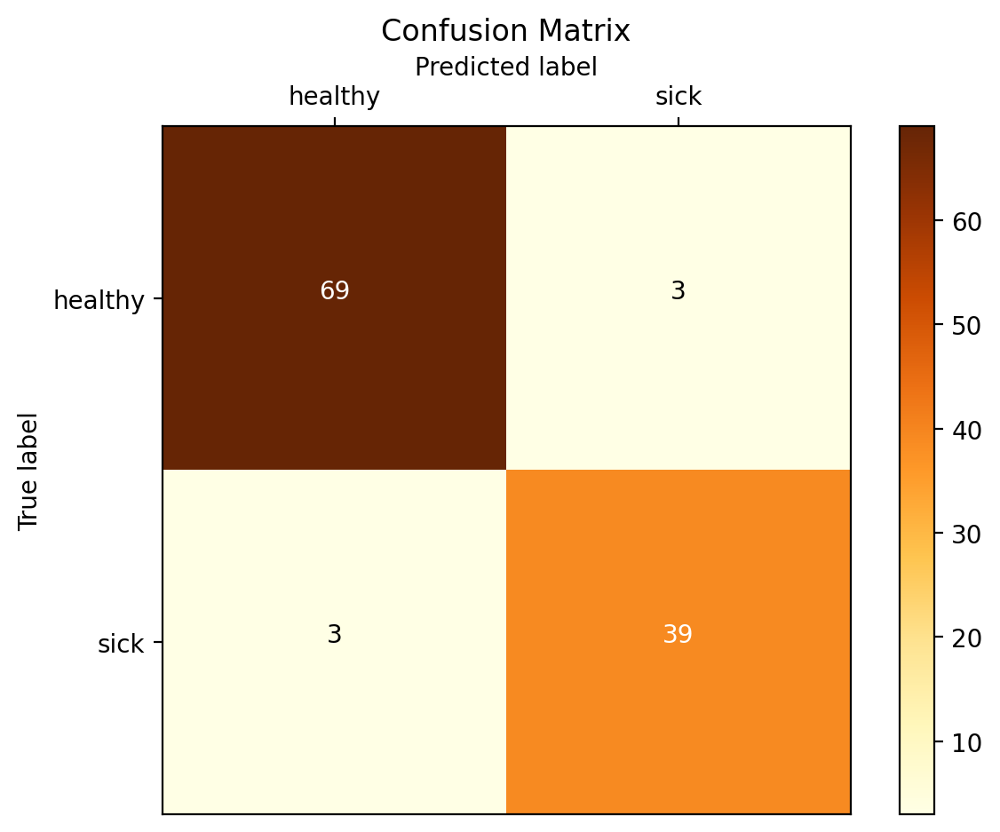

In [7]:
print("%-12s %f" % ("Accuracy:", metrics.accuracy_score(target_test, predicted)))
print("Confusion Matrix: \n", metrics.confusion_matrix(target_test, predicted))
draw_confusion_matrix(target_test, predicted, ["healthy", "sick"])


###  Parameters for Decision Tree Classifier

In `scikit-learn`, the following are just some of the parameters we can pass into the Decision Tree Classifier:

- `criterion`: {`gini`, `entropy`, `log_loss`} default=`gini`
    - The function to measure the quality of a split. Supported criteria are `gini` for the Gini impurity and `log_loss` and `entropy` both for the Shannon information gain 
- `splitter`: {`best`, `random`}, default=`best`
    - The strategy used to choose the split at each node. `best` aims to find the best feature split amongst all features. `random` only looks for the best split amongst a random subset of features.
- `max_depth`: int, default = 2 {`newton-cg`, `lbfgs`, `liblinear`, `sag`, `saga`}, default=`lbfgs`
    - The maximum depth of the tree.
- `min_samples_split`: `int` or `float`, default=`2`
    - The minimum number of samples required to split an internal node. If `int`, then consider `min_samples_split` as the minimum number. If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split.

### Visualizing Decision Trees

Scikit-learn allows us to visualize the decision tree to see what features it choose to split and what the result is. Note that if the condition in the node is true, you traverse the left edge of the node. Otherwise, you traverse the right edge.

[Text(0.5, 0.8333333333333334, 'concave points_mean <= 0.174\ngini = 0.468\nsamples = 100.0%\nvalue = [0.626, 0.374]'),
 Text(0.25, 0.5, 'area_mean <= 0.102\ngini = 0.144\nsamples = 64.8%\nvalue = [0.922, 0.078]'),
 Text(0.125, 0.16666666666666666, '\n  (...)  \n'),
 Text(0.375, 0.16666666666666666, '\n  (...)  \n'),
 Text(0.75, 0.5, 'texture_mean <= -0.821\ngini = 0.149\nsamples = 35.2%\nvalue = [0.081, 0.919]'),
 Text(0.625, 0.16666666666666666, '\n  (...)  \n'),
 Text(0.875, 0.16666666666666666, '\n  (...)  \n')]

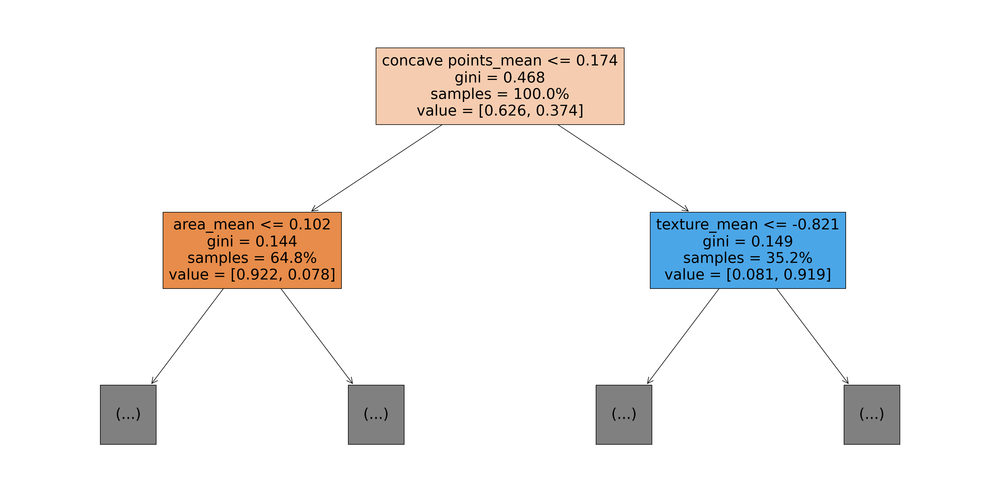

In [9]:
plt.figure(figsize=(30, 15))
# Note that we have to pass the feature names into the plotting function to get the actual names
# We pass the column names through the pipeline in case any feature augmentation was made
# For example, a categorical feature will be split into multiple features with one hot encoding
# and this way assigns a name to each column based on the feature value and the original feature name
tree.plot_tree(
    clf, max_depth=1, proportion=True, feature_names=feature_names, filled=True
)


We can even look at the tree in a textual format.

In [10]:
print(export_text(clf, feature_names=feature_names))


|--- concave points_mean <= 0.17
|   |--- area_mean <= 0.10
|   |   |--- area_se <= -0.02
|   |   |   |--- concave points_mean <= -0.09
|   |   |   |   |--- fractal_dimension_se <= -0.87
|   |   |   |   |   |--- fractal_dimension_se <= -0.88
|   |   |   |   |   |   |--- smoothness_se <= -1.24
|   |   |   |   |   |   |   |--- compactness_se <= -0.99
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- compactness_se >  -0.99
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- smoothness_se >  -1.24
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- fractal_dimension_se >  -0.88
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- fractal_dimension_se >  -0.87
|   |   |   |   |   |--- texture_mean <= 0.71
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- texture_mean >  0.71
|   |   |   |   |   |   |--- texture_mean <= 0.74
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- texture_mea

### Feature Importance in Decision Trees

Decision Trees can also assign importance to features by measuring the average decrease in impurity (i.e. information gain) for each feature. The features with higher decreases are treated as more important. 

<Axes: >

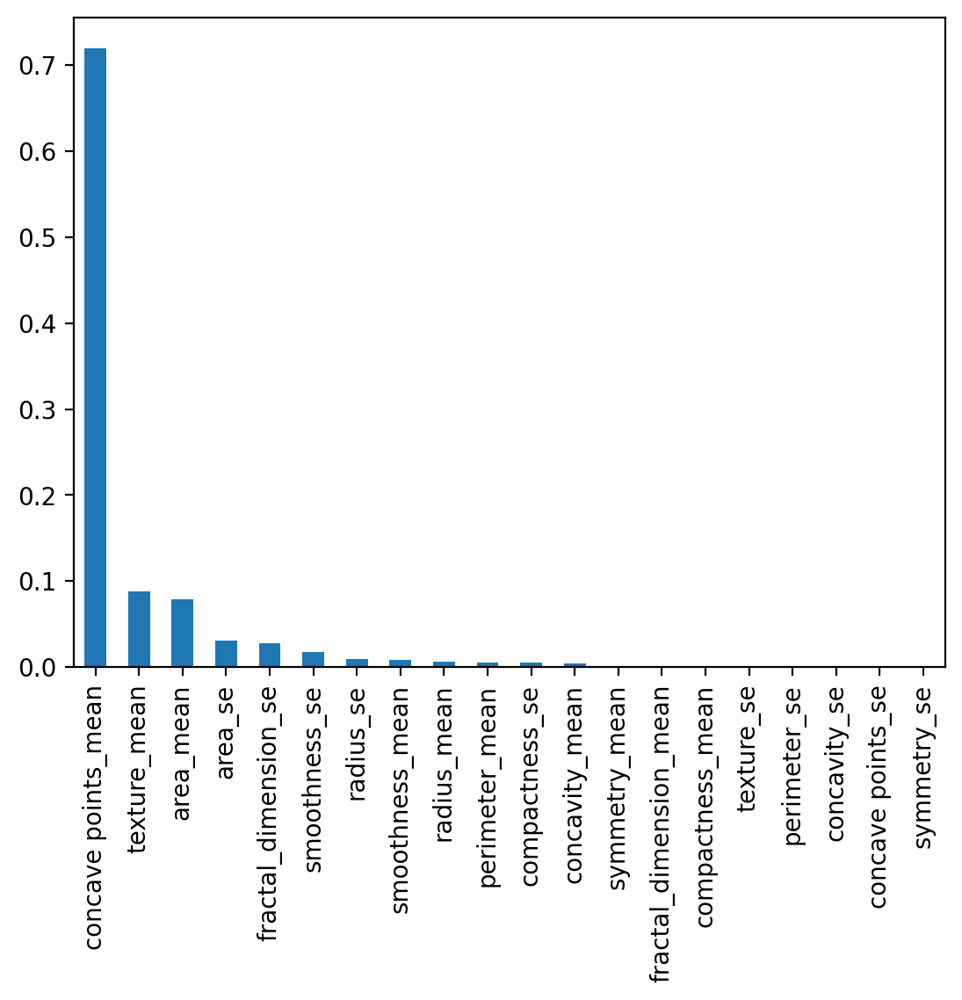

In [11]:
imp_pd = pd.Series(data=clf.feature_importances_, index=feature_names)
imp_pd = imp_pd.sort_values(ascending=False)
imp_pd.plot.bar()


We can clearly see that "concave points_mean" has the largest importance due to it providing the most reduction in the impurity.

### Visualizing decision boundaries for Decision Trees

Similar to project 2, lets see what decision boundaries that a Decision Tree creates. We use the two most correlated features to the target labels: concave_points_mean and perimeter_mean. 

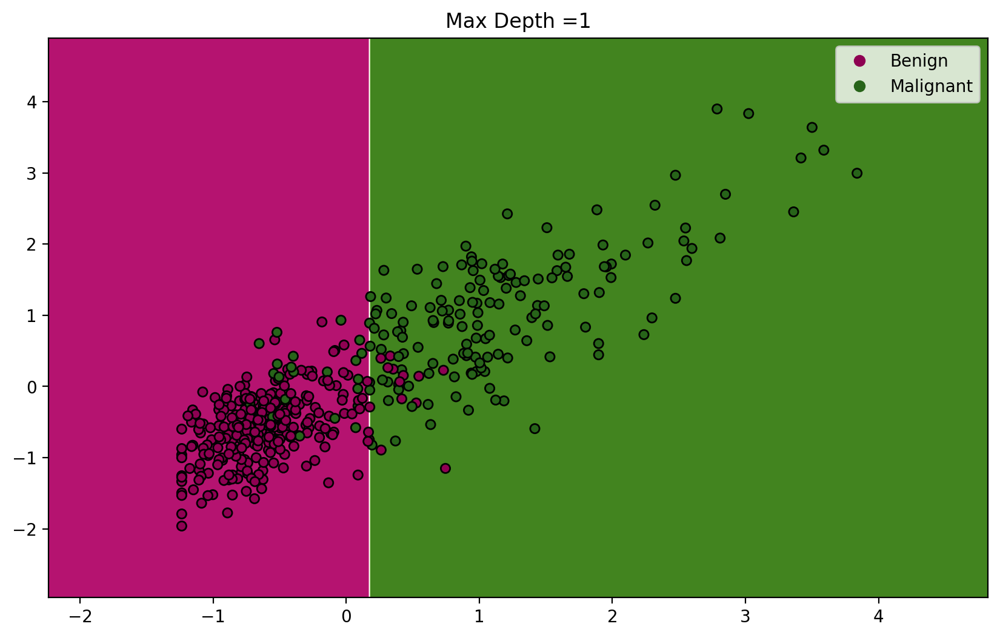

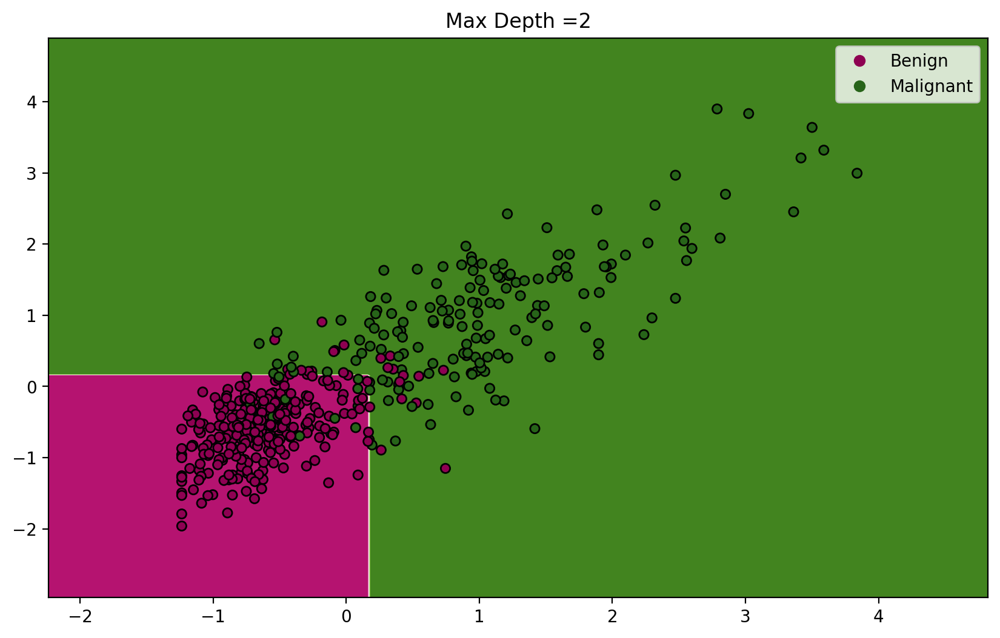

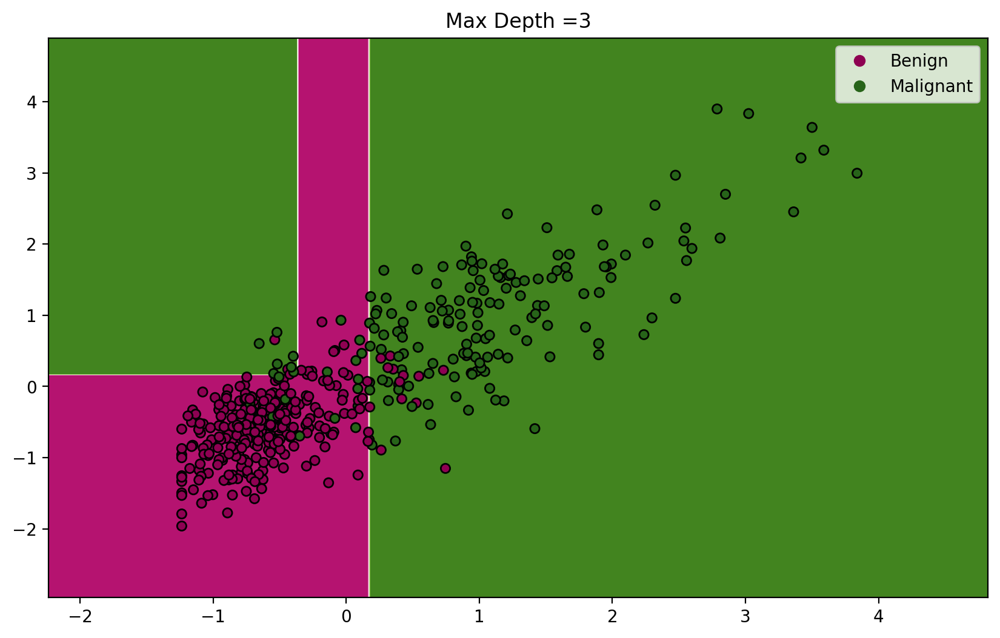

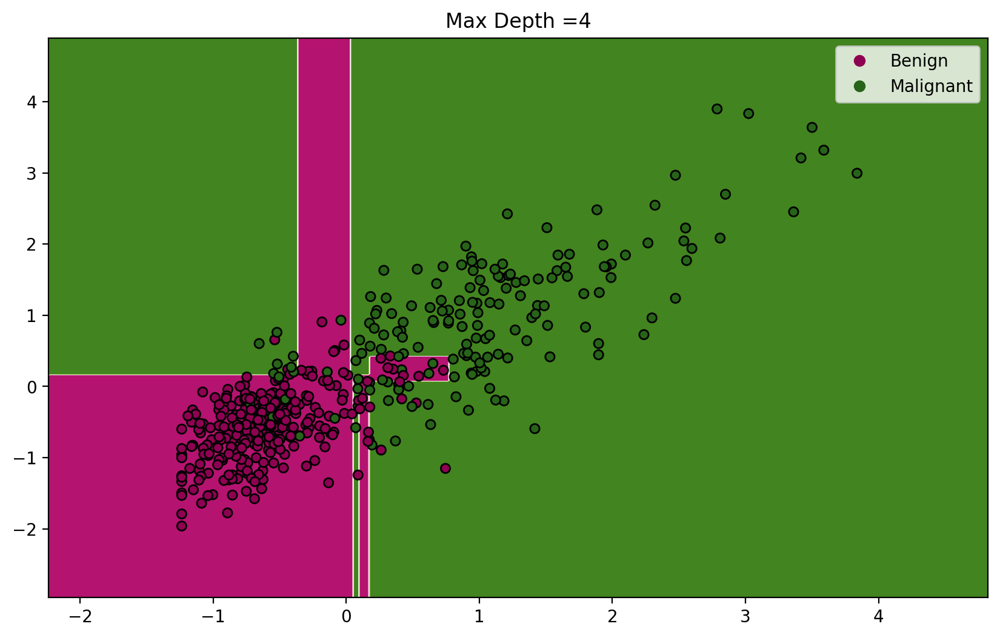

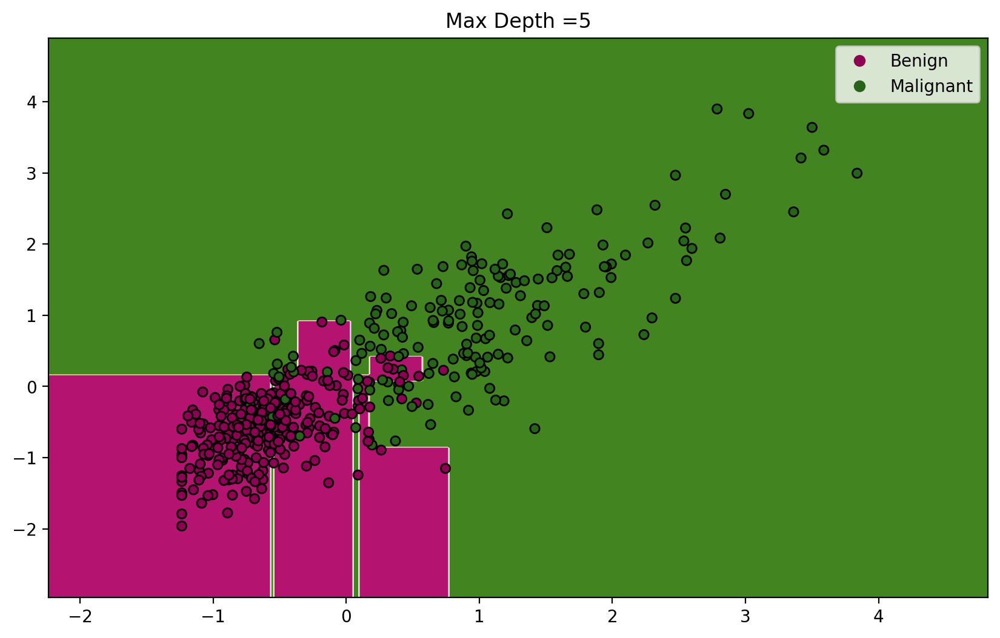

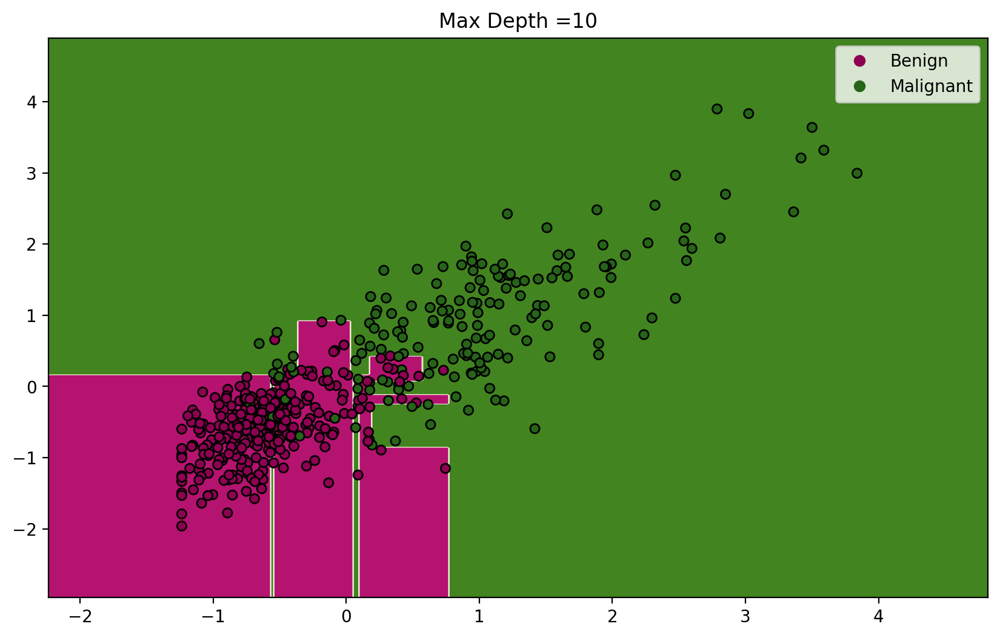

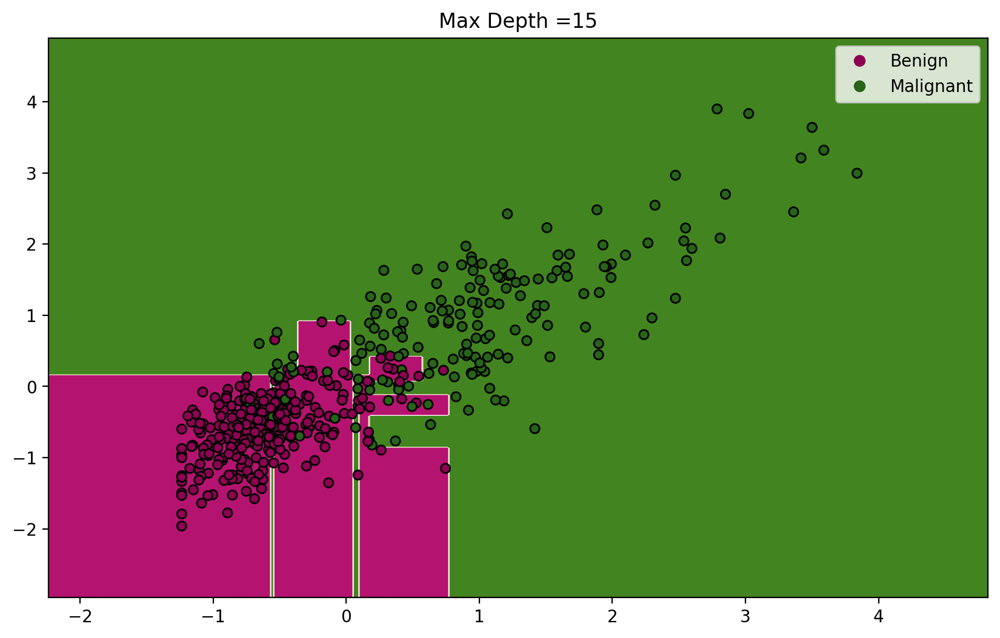

In [12]:
# Extract first two feature and use the standardscaler
train_2 = StandardScaler().fit_transform(
    train_raw[["concave points_mean", "perimeter_mean"]]
)

depth = [1, 2, 3, 4, 5, 10, 15]
for d in depth:
    dt = DecisionTreeClassifier(max_depth=d, min_samples_split=7)
    dt.fit(train_2, target)
    draw_contour(train_2, target, dt, class_labels=["Benign", "Malignant"])

    plt.title(f"Max Depth ={d}")


We can see that the model gets more and more complex with increasing depth until it converges somewhere in between depth 10 and 15. 

## Supervised Learning: Multi-Layer Perceptron (MLP)

A neural network is a series of algorithms that endeavors to recognize underlying relationships in a set of data through a process that mimics the way the human brain operates. Neural networks are very powerful tools that are used a in a variety of applications including image and speech processing. In class, we have discussed one of the earliest types of neural networks known as a Multi-Layer Perceptron. 

![steps](jupyter_images/mlp_example.png)

### Using MLP for classification

In [13]:
# from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, random_state=SEED)
clf.fit(train, target)
predicted = clf.predict(test)


Accuracy:    0.938596
Confusion Matrix: 
 [[69  3]
 [ 4 38]]


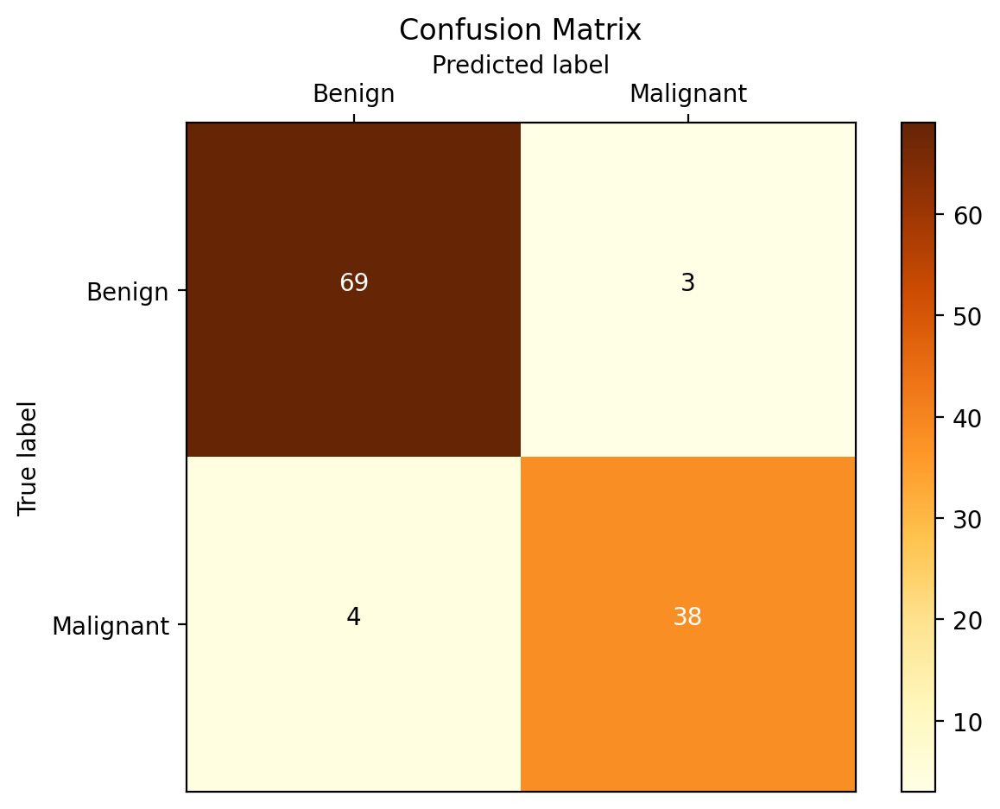

In [14]:
print("%-12s %f" % ("Accuracy:", metrics.accuracy_score(target_test, predicted)))
print("Confusion Matrix: \n", metrics.confusion_matrix(target_test, predicted))
draw_confusion_matrix(target_test, predicted, ["Benign", "Malignant"])


###  Parameters for MLP Classifier

In `scikit-learn`, the following are just some of the parameters we can pass into MLP Classifier:

- `hidden_layer_sizes`: `tuple`, length = n_layers - 2, default=(100,)
    - The ith element represents the number of neurons in the ith hidden layer. 
- `activation`: {`identity`, `logistic`, `tanh`,`relu`}, default=`relu`
    - Activation function for the hidden layer.
- `alpha`: `float`, default = 0.0001
    - Strength of the L2 regularization term. The L2 regularization term is divided by the sample size when added to the loss.
- `max_iter`: `int`, default=200
    - Maximum number of iterations taken for the solvers to converge.

### Visualizing decision boundaries for MLP

Now, lets see how the decision boundaries change as a function of both the activation function and the number of hidden layers.

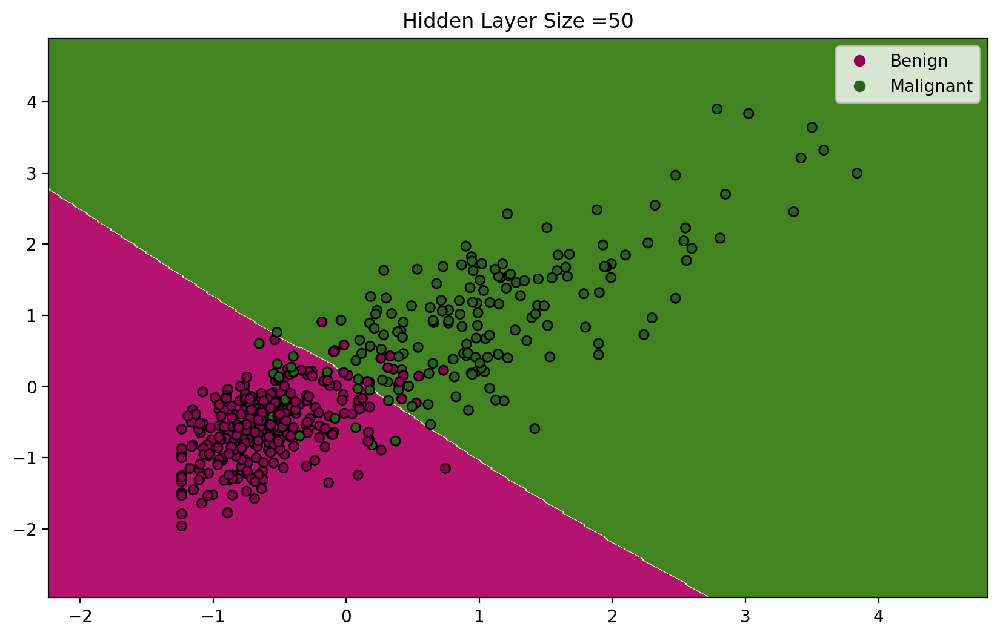

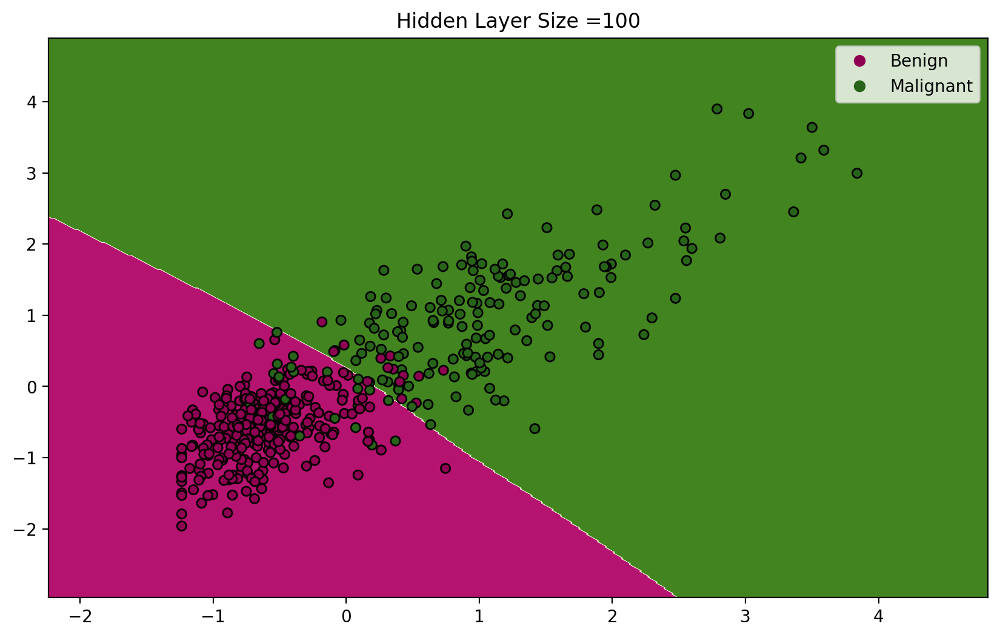

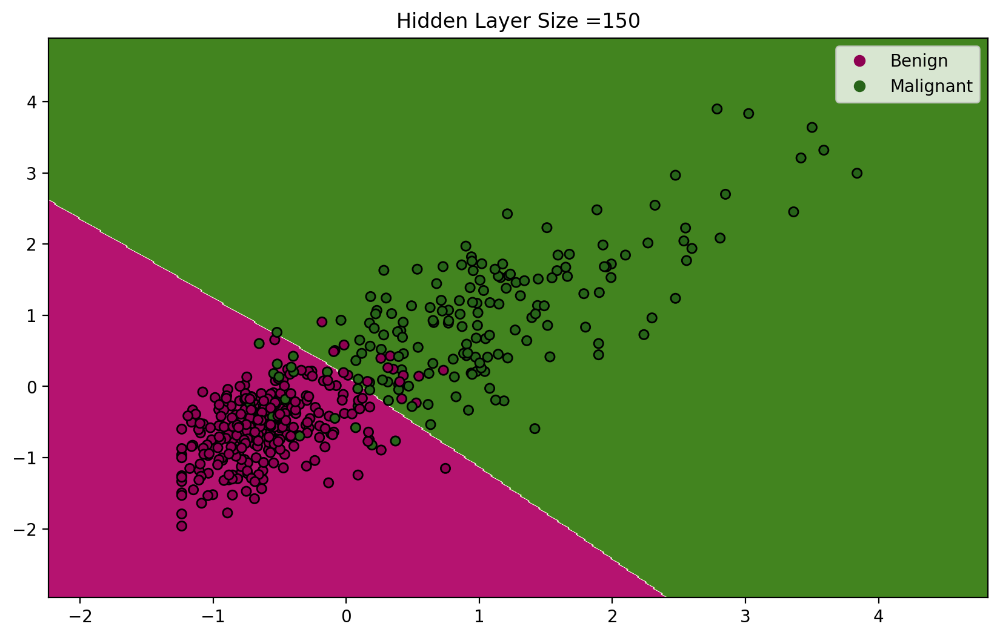

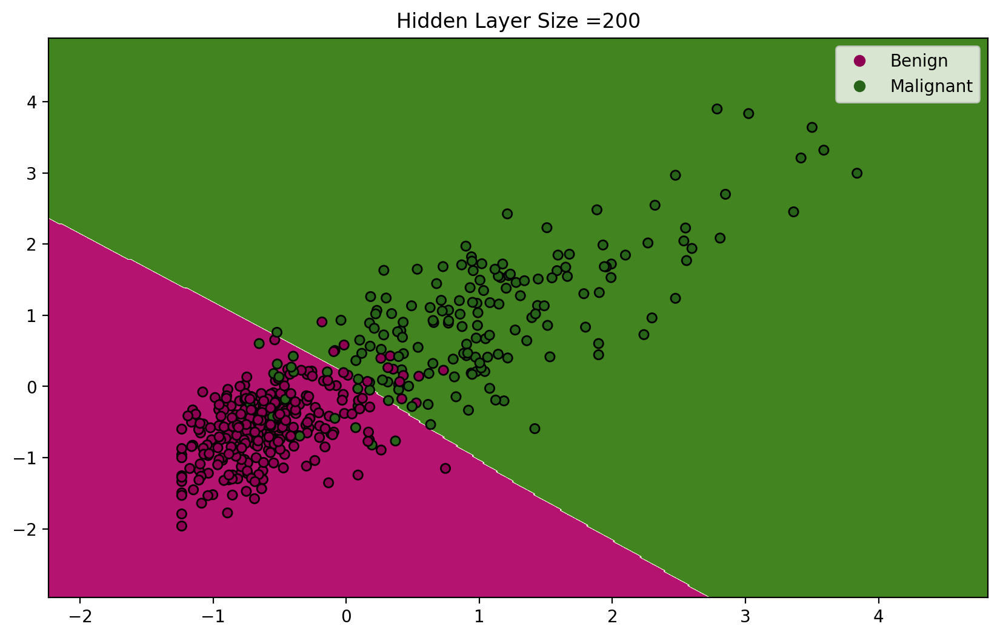

In [15]:
# Example of using the default Relu activation while altering the number of hidden layers
train_2 = StandardScaler().fit_transform(
    train_raw[["concave points_mean", "perimeter_mean"]]
)

layers = [50, 100, 150, 200]
for l in layers:
    mlp = MLPClassifier(hidden_layer_sizes=(l,), max_iter=400)
    mlp.fit(train_2, target)
    draw_contour(train_2, target, mlp, class_labels=["Benign", "Malignant"])
    plt.title(f"Hidden Layer Size ={l}")


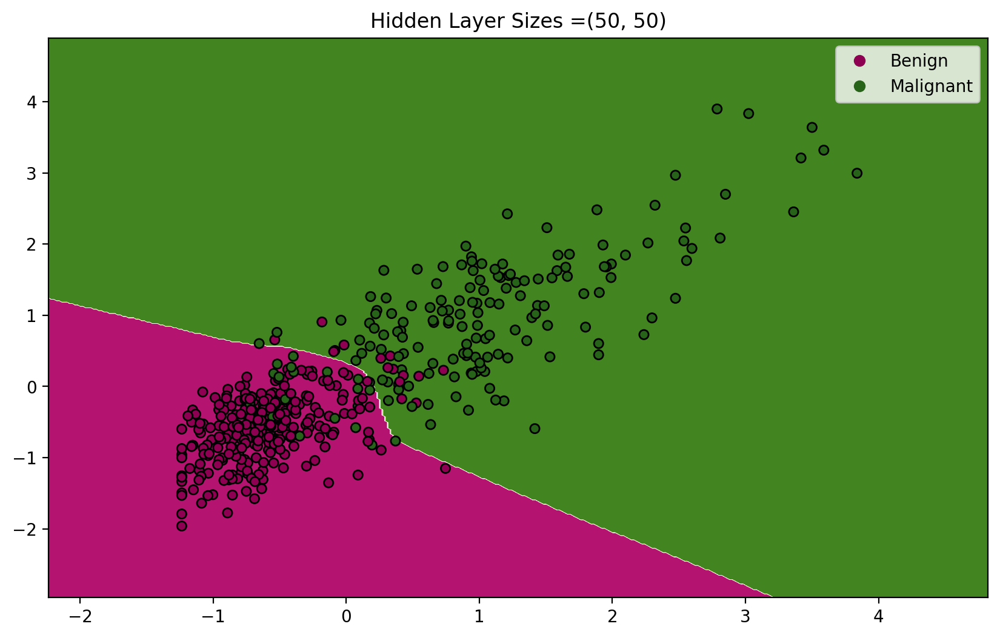

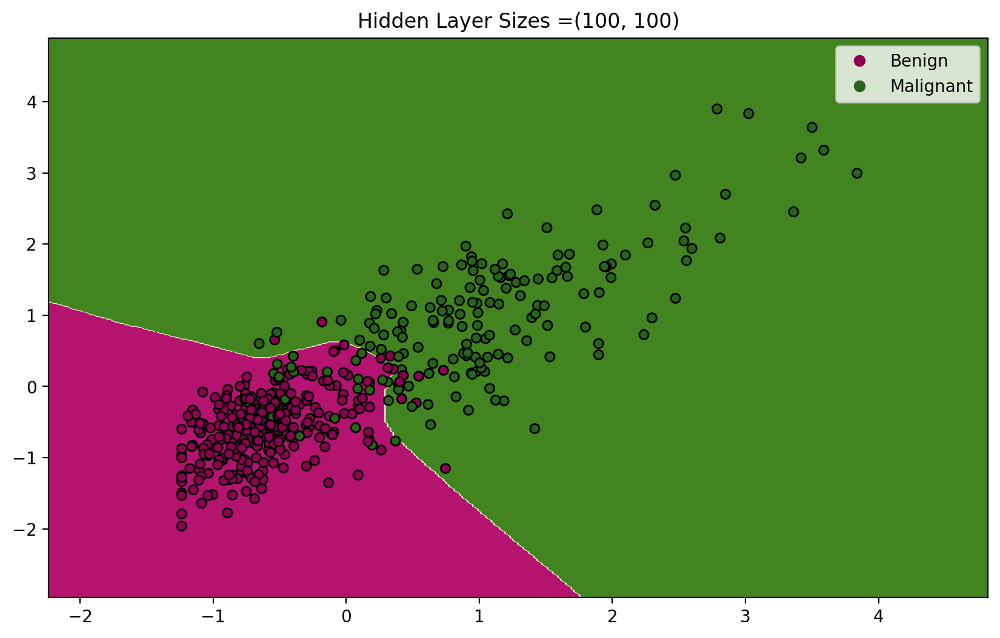

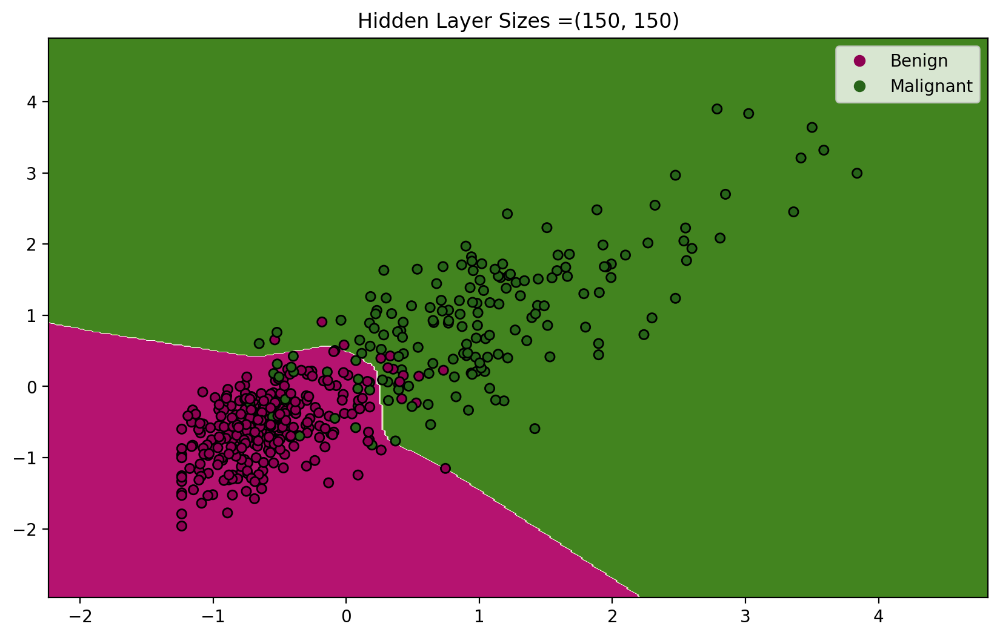

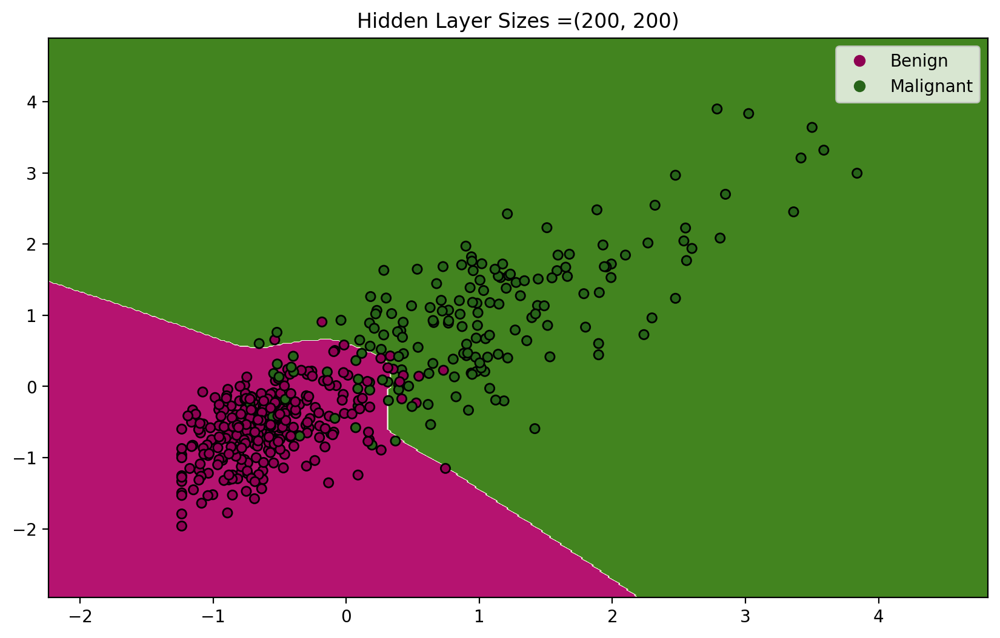

In [16]:
# Example of using the default Relu activation
# while altering the number of hidden layers with 2 groups of hidden layers
train_2 = StandardScaler().fit_transform(
    train_raw[["concave points_mean", "perimeter_mean"]]
)

layers = [50, 100, 150, 200]
for l in layers:
    mlp = MLPClassifier(hidden_layer_sizes=(l, l), max_iter=400)
    mlp.fit(train_2, target)
    draw_contour(train_2, target, mlp, class_labels=["Benign", "Malignant"])
    plt.title(f"Hidden Layer Sizes ={(l,l)}")


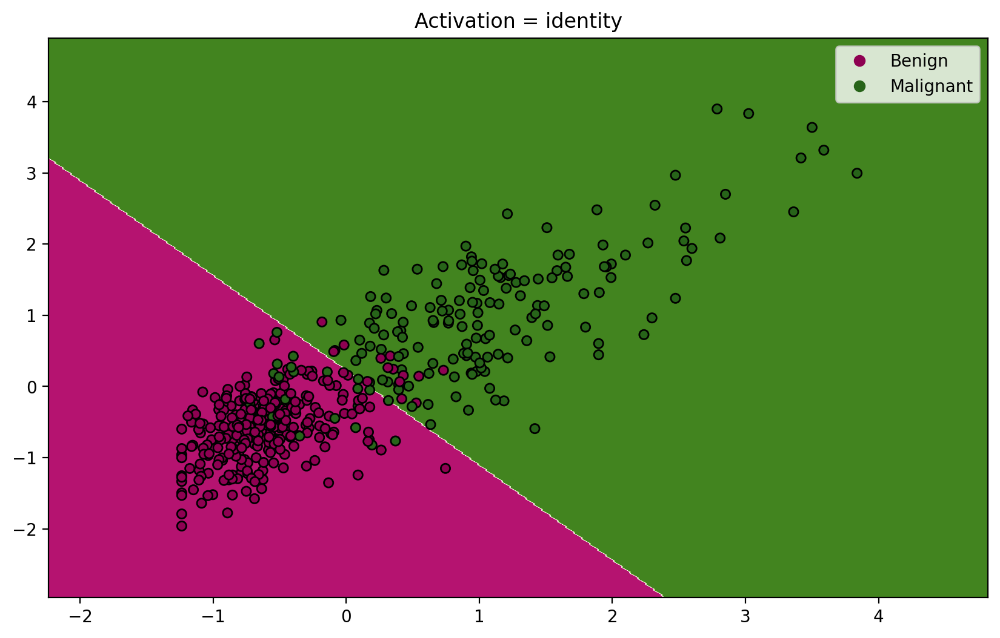

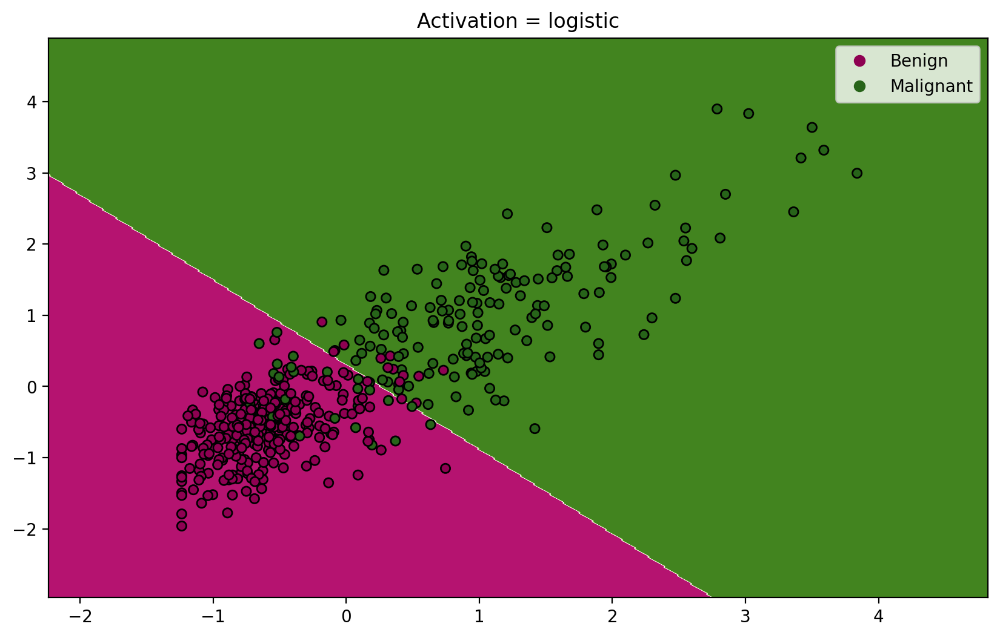

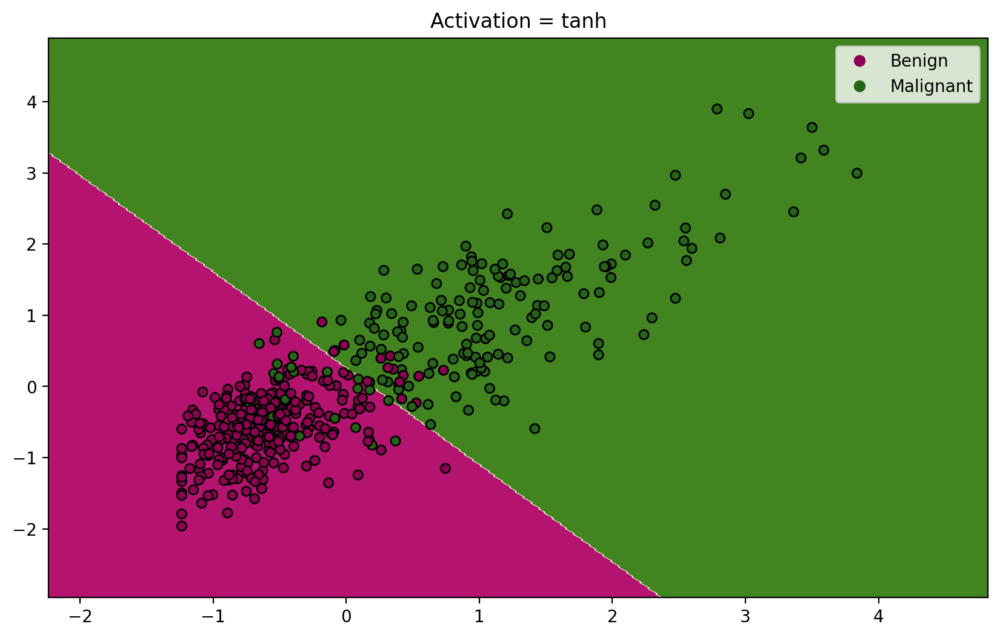

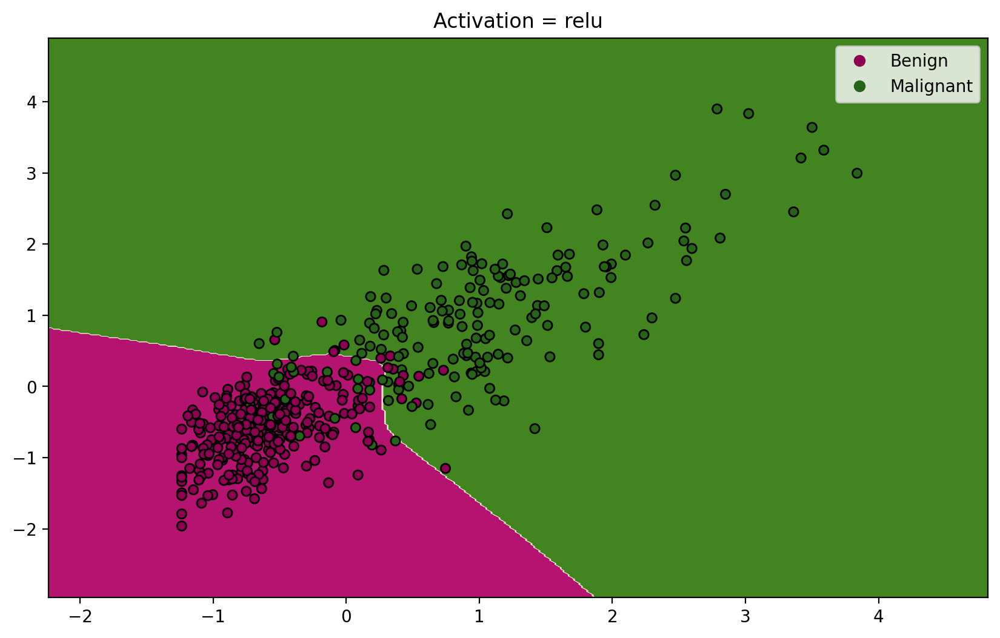

In [17]:
# Example of using 2 hidden layers of 100 units each with varying activations
train_2 = StandardScaler().fit_transform(
    train_raw[["concave points_mean", "perimeter_mean"]]
)

acts = ["identity", "logistic", "tanh", "relu"]
for act in acts:
    mlp = MLPClassifier(hidden_layer_sizes=(100, 100), activation=act, max_iter=400)
    mlp.fit(train_2, target)
    draw_contour(train_2, target, mlp, class_labels=["Benign", "Malignant"])

    plt.title(f"Activation = {act}")


## Unsupervised learning: PCA

As shown in lecture, PCA is a valuable dimensionality reduction tool that can extract a small subset of valuable features. In this section, we shall demonstrate how PCA can extract important visual features from pictures of subjects faces. We shall use the [AT&T Database of Faces](https://www.kaggle.com/datasets/kasikrit/att-database-of-faces). This dataset contains 40 different subjects with 10 samples per subject which means we a dataset of 400 samples. 

We extract the images from the [scikit-learn dataset library](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_olivetti_faces.html#sklearn.datasets.fetch_olivetti_faces). The library imports the images (faces.data), the flatten array of images (faces.images), and which subject eacj image belongs to (faces.target). Each image is a 64 by 64 image with pixels converted to floating point values in [0,1].

### Eigenfaces

The following codes downloads and loads the face data. 

In [18]:
# Import faces from scikit library
faces = datasets.fetch_olivetti_faces()
print("Flattened Face Data shape:", faces.data.shape)
print("Face Image Data Shape:", faces.images.shape)
print("Shape of target data:", faces.target.shape)


Flattened Face Data shape: (400, 4096)
Face Image Data Shape: (400, 64, 64)
Shape of target data: (400,)


In [19]:
# Extract image shape for future use
im_shape = faces.images[0].shape


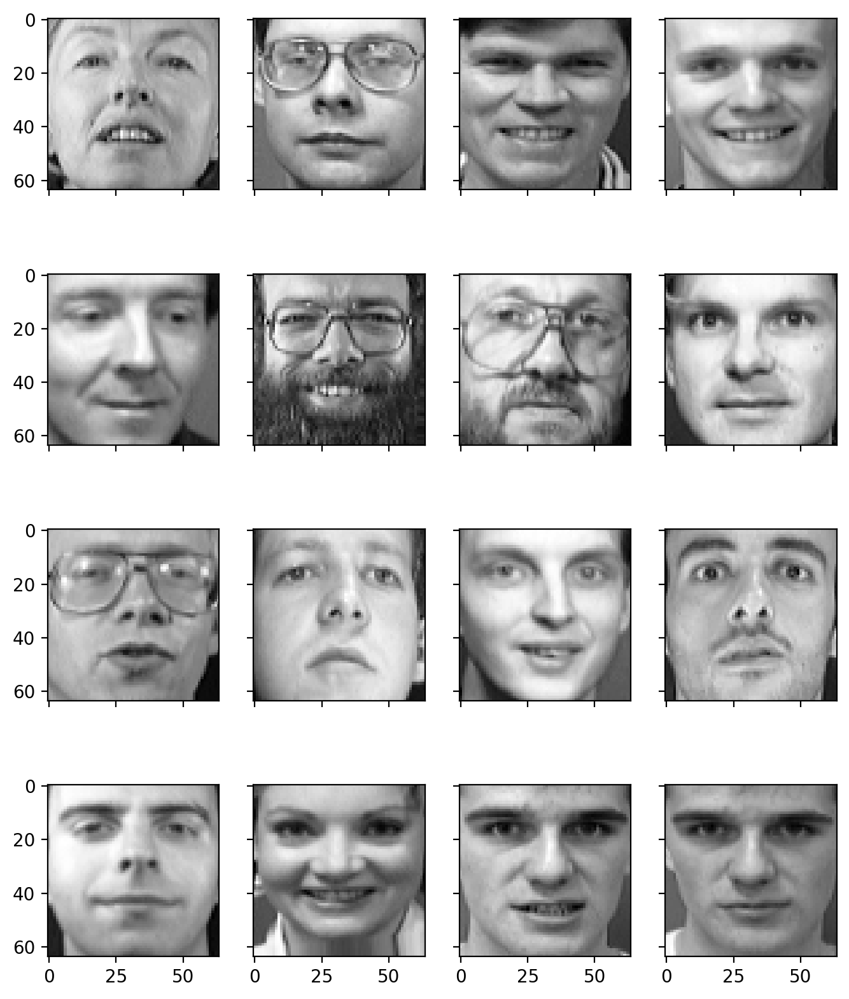

In [20]:
# Prints some example faces
faceimages = faces.images[
    np.random.choice(len(faces.images), size=16, replace=False)
]  # take random 16 images

fig, axes = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(8, 10))
for i in range(16):
    axes[i % 4][i // 4].imshow(faceimages[i], cmap="gray")
plt.show()


Now, let us see what features we can extract from these face images.

In [21]:
# from sklearn.decomposition import PCA

pca = PCA()
pca_pipe = Pipeline(
    [
        (
            "scaler",
            StandardScaler(),
        ),  # Scikit learn PCA does not standardize so we need to add
        ("pca", pca),
    ]
)
pca_pipe.fit(faces.data)


Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA())])

The following plots the top 30 PCA components with how much variance does this feature explain.

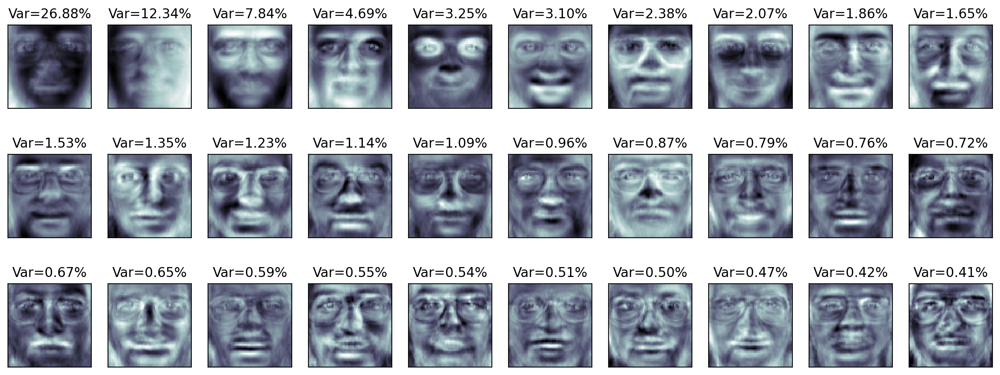

In [22]:
fig = plt.figure(figsize=(16, 6))
for i in range(30):
    ax = fig.add_subplot(3, 10, i + 1, xticks=[], yticks=[])
    ax.imshow(pca.components_[i].reshape(im_shape), cmap=plt.cm.bone)
    ax.set_title(f"Var={pca.explained_variance_ratio_[i]:.2%}")


Amazing! We can see that the model has learned to focus on many features that we as humans also look at when trying to identify a face such as the nose,eyes, eyebrows, etc.

With this feature extraction, we can perform much more powerful learning. 

### Feature Extraction for Classification

Lets see if we can use PCA to improve the accuracy of the decision tree classifier.

Accuracy without PCA
Accuracy:    0.929825
Confusion Matrix: 
 [[68  4]
 [ 4 38]]


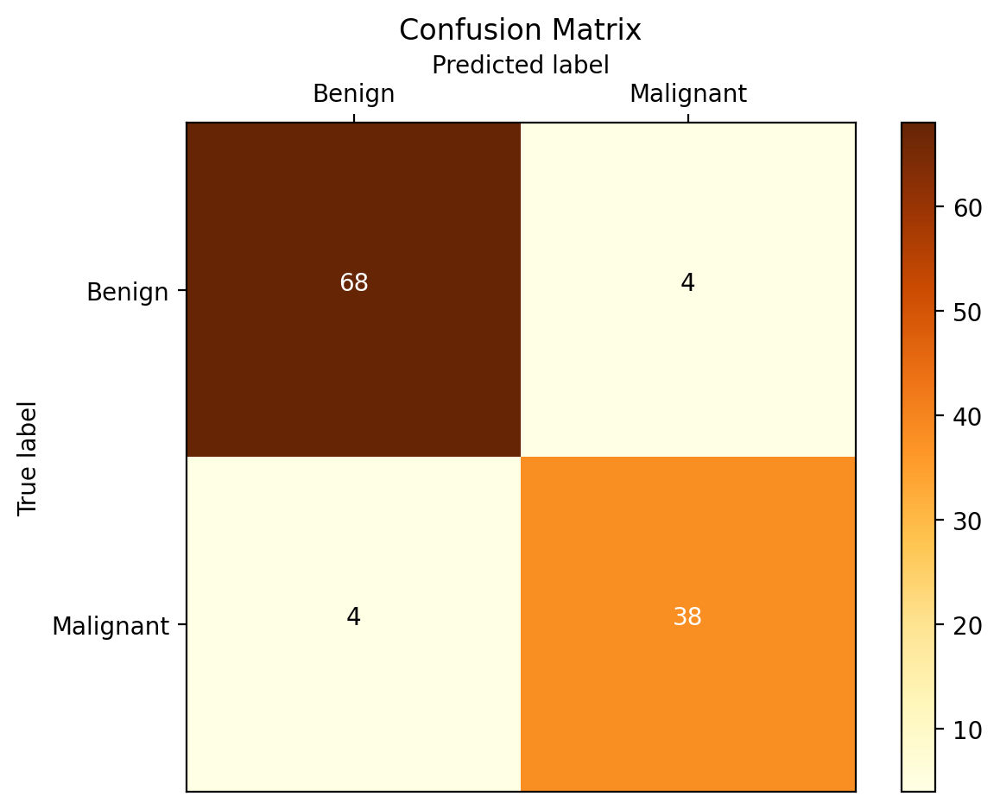

Accuracy with PCA
Accuracy:    0.885965
Confusion Matrix: 
 [[63  9]
 [ 4 38]]


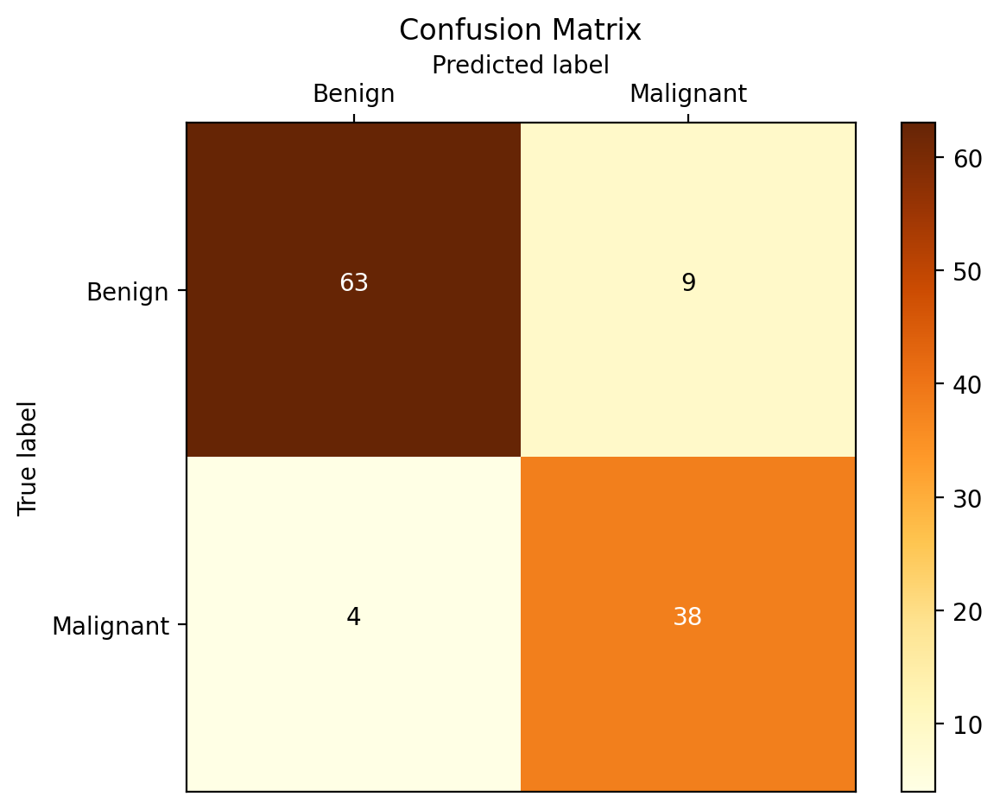

In [33]:
# Without PCA
clf = DecisionTreeClassifier(random_state=SEED)
clf.fit(train, target)
predicted = clf.predict(test)

print("Accuracy without PCA")
print("%-12s %f" % ("Accuracy:", metrics.accuracy_score(target_test, predicted)))
print("Confusion Matrix: \n", metrics.confusion_matrix(target_test, predicted))
draw_confusion_matrix(target_test, predicted, ["Benign", "Malignant"])

# With PCA
pca = PCA(n_components=0.9)  # Take components that explain at lest 90% variance

train_new = pca.fit_transform(train)
test_new = pca.transform(test)

clf_pca = DecisionTreeClassifier(random_state=SEED)
clf_pca.fit(train_new, target)
predicted = clf_pca.predict(test_new)

print("Accuracy with PCA")
print("%-12s %f" % ("Accuracy:", metrics.accuracy_score(target_test, predicted)))
print("Confusion Matrix: \n", metrics.confusion_matrix(target_test, predicted))
draw_confusion_matrix(target_test, predicted, ["Benign", "Malignant"])


In [24]:
print("Number of Features without PCA: ", train.shape[1])
print("Number of Features with PCA: ", train_new.shape[1])


Number of Features without PCA:  20
Number of Features with PCA:  7


Clearly, we get a much better accuracy for the model while using fewer features. But does the features the PCA thought were important the same features that the decision tree used. Lets look at the feature importance of the tree. The following plot numbers the first principal component as 0, the second as 1, and so forth.

<Axes: >

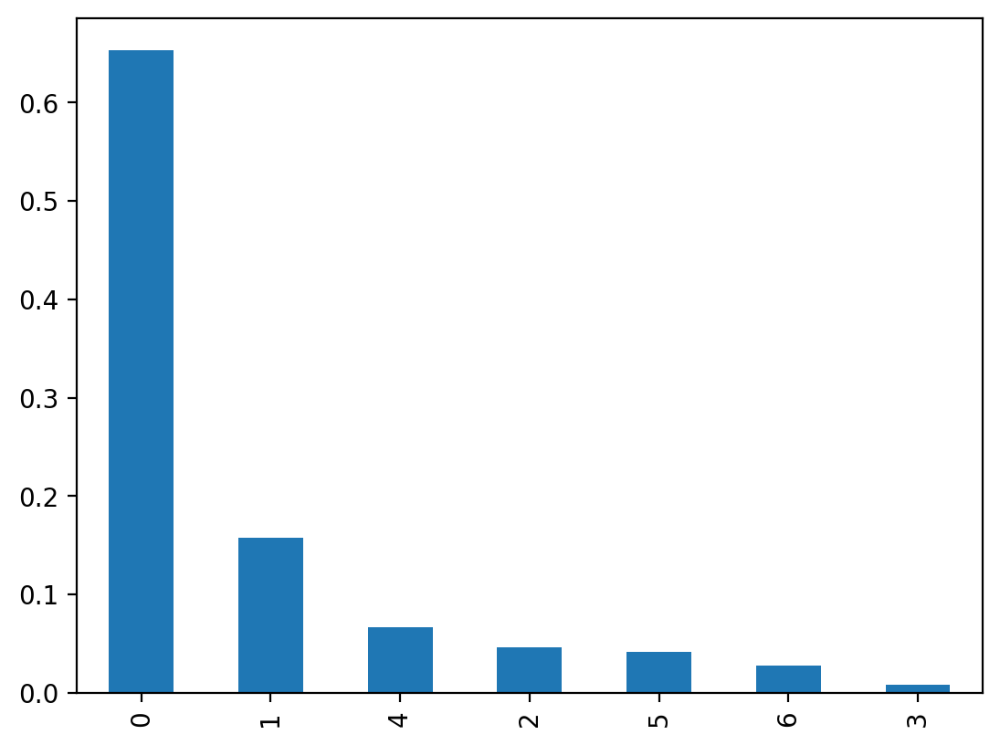

In [25]:
feature_names_new = list(range(train_new.shape[1]))
imp_pd = pd.Series(data=clf_pca.feature_importances_, index=feature_names_new)
imp_pd = imp_pd.sort_values(ascending=False)
imp_pd.plot.bar()


Amazingly, the first and second components were the most important features in the decision tree. Thus, we can claim that PCA has significantly improved the performance of our model. 

## Unsupervised learning: Clustering

Clustering is the task of grouping a set of objects in such a way that objects in the same group (called a cluster) are more similar (in some sense) to each other than to those in other groups. One major algorithm we learned in class is the K-Means algorithm.

### Evaluating K-Means performance

While there are many ways to evaluate the [performance measure of clustering algorithsm](https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation), we will focus on the inertia score of the K-Means model. Inertia is another term for the sum of squared distances of samples to their closest cluster center. 

Let us look at how the Inertia changes as a function of the number of clusters for an artificial dataset.


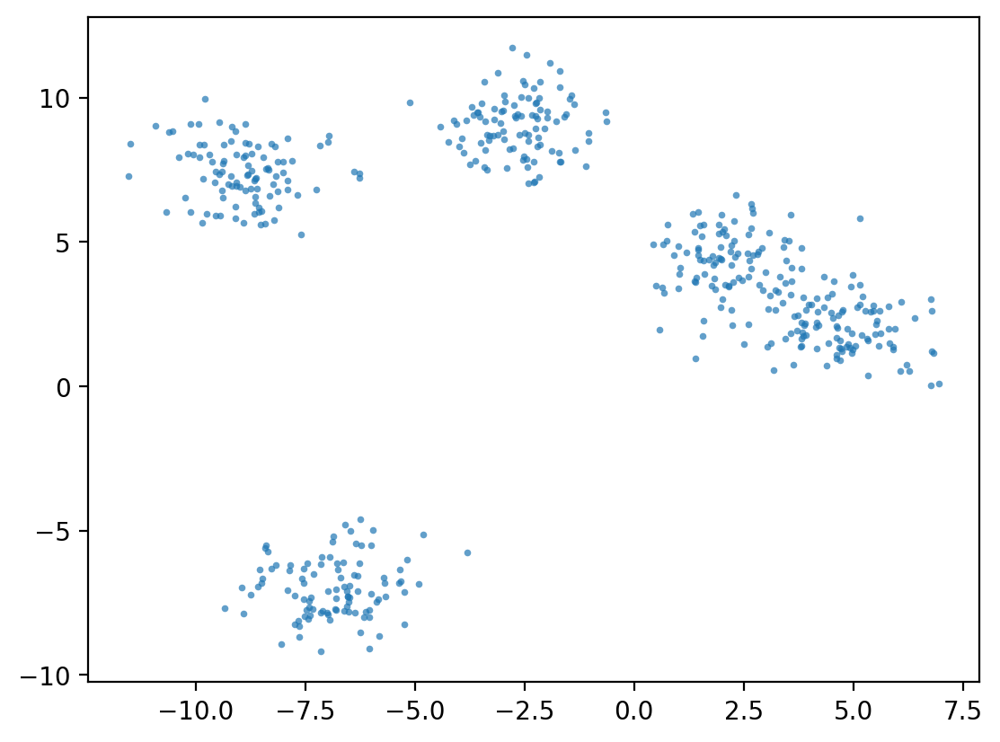

In [26]:
# Artifical Dataset
X, y = make_blobs(
    n_samples=500,
    n_features=2,
    centers=5,
    cluster_std=1,
    center_box=(-10.0, 10.0),
    shuffle=True,
    random_state=SEED,
)

plt.scatter(X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, edgecolor="k")


In [27]:
ks = list(range(2, 10))

inertia = []
for k in ks:
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=SEED)
    kmeans.fit(X)
    # inertia method returns wcss for that model
    inertia.append(kmeans.inertia_)
    print(f"Inertia for K = {k}: {kmeans.inertia_}")


Inertia for K = 2: 14726.117037953445
Inertia for K = 3: 3648.763582876105
Inertia for K = 4: 1543.387197801293
Inertia for K = 5: 924.0989923406016
Inertia for K = 6: 856.8026818178562
Inertia for K = 7: 776.0242779434338
Inertia for K = 8: 721.0693595755168
Inertia for K = 9: 647.1023548251045


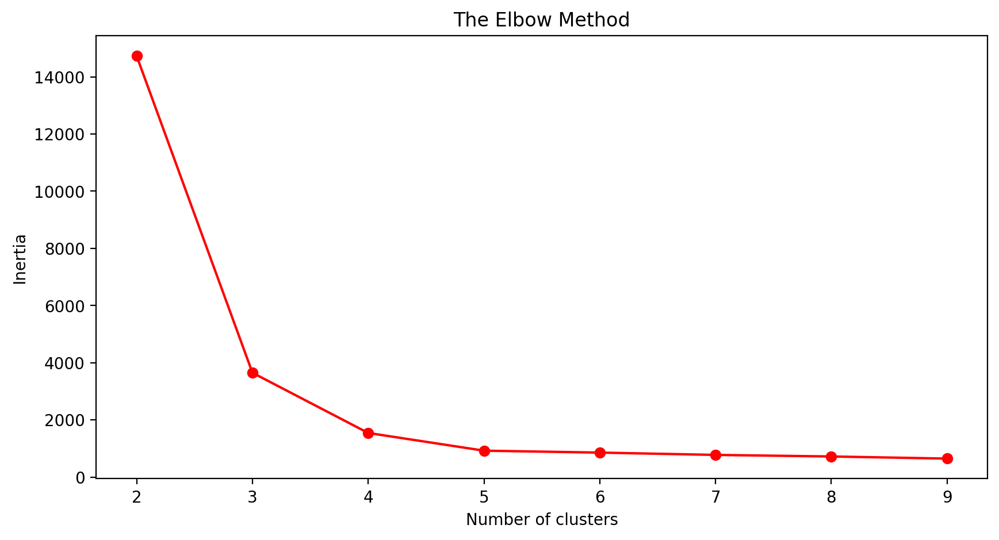

In [28]:
plt.figure(figsize=(10, 5))
plt.plot(ks, inertia, marker="o", color="red")
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.show()


From the plot, we can see that when the number of clusters of K-means is the correct number of clusters, Inertia starts decreasing at a much slower rate. This creates a kind of elbow shape in the graph. For K-means clustering, the elbow method selects the number of clusters where the elbow shape is formed. In this case, we see that this method would produce the correct number of clusters.

Lets try it on the cancer dataset.

In [29]:
ks = list(range(2, 30))
inertia = []
for k in ks:
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=SEED)
    kmeans.fit(train)
    # inertia method returns wcss for that model
    inertia.append(kmeans.inertia_)
    print(f"Inertia for K = {k}: {kmeans.inertia_:.2f}")


Inertia for K = 2: 6407.52
Inertia for K = 3: 5601.69
Inertia for K = 4: 5057.25
Inertia for K = 5: 4647.76
Inertia for K = 6: 4271.34
Inertia for K = 7: 4145.98
Inertia for K = 8: 3937.25
Inertia for K = 9: 3639.79
Inertia for K = 10: 3588.19
Inertia for K = 11: 3438.82
Inertia for K = 12: 3310.55
Inertia for K = 13: 3130.01
Inertia for K = 14: 3013.64
Inertia for K = 15: 2927.15
Inertia for K = 16: 2880.96
Inertia for K = 17: 2771.09
Inertia for K = 18: 2699.71
Inertia for K = 19: 2658.41
Inertia for K = 20: 2557.89
Inertia for K = 21: 2506.29
Inertia for K = 22: 2479.96
Inertia for K = 23: 2408.70
Inertia for K = 24: 2354.52
Inertia for K = 25: 2316.05
Inertia for K = 26: 2263.63
Inertia for K = 27: 2223.74
Inertia for K = 28: 2181.57
Inertia for K = 29: 2131.49


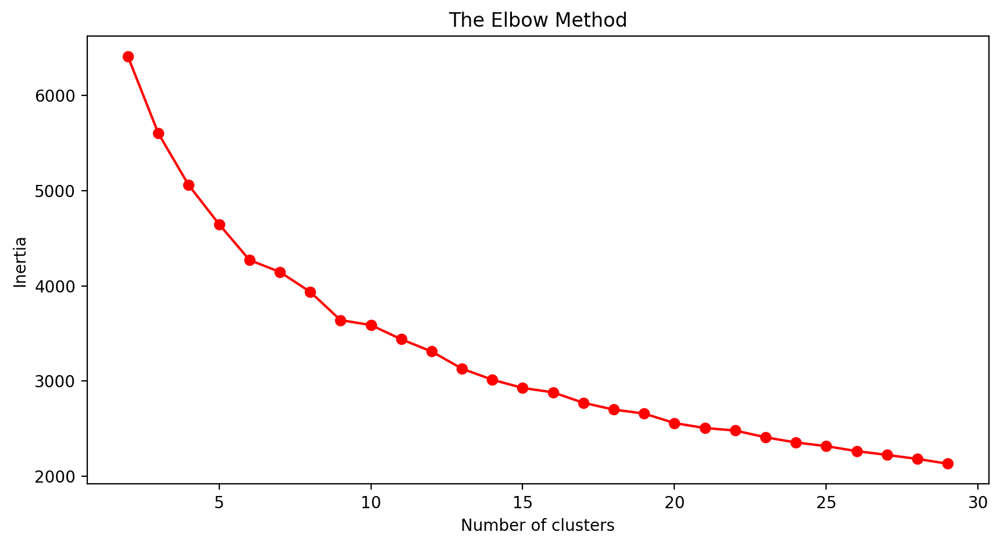

In [30]:
plt.figure(figsize=(10, 5))
plt.plot(ks, inertia, marker="o", color="red")
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.show()


Here we see that the elbow is not as cleanly defined. This may be due to the dataset not being a good fit for K-means. Regardless, we can still apply the elbow method by noting that the slow down happens around 7~14.

### Kmeans on Eigenfaces

Now, lets see how K-means performs in clustering the face data with PCA.

In [31]:
from sklearn.cluster import KMeans

n_clusters = 10  # We know there are 10 subjects
km = KMeans(n_clusters=n_clusters, random_state=SEED)

pipe = Pipeline(
    [
        ("scaler", StandardScaler()),  # First standardize
        ("pca", PCA()),  # Transform using pca
        ("kmeans", km),
    ]
)  # Then apply k means


In [32]:
clusters = pipe.fit_predict(faces.data)
print(clusters)


[3 4 9 7 9 2 3 2 2 9 8 8 8 8 8 8 8 8 8 8 0 0 0 5 7 5 7 7 9 9 0 0 0 9 9 7 9
 0 8 6 0 0 0 0 7 7 7 7 7 2 9 9 9 2 2 2 2 2 2 2 3 6 3 3 3 3 3 3 3 3 4 4 4 4
 4 4 4 4 2 4 0 0 0 7 0 7 7 9 0 9 0 0 0 0 9 9 9 9 7 4 6 6 6 6 6 6 6 6 6 6 9
 0 7 0 0 7 0 9 9 9 0 0 7 7 9 9 7 7 9 7 0 0 0 9 0 0 0 0 0 0 6 0 6 6 0 6 0 0
 0 0 8 3 3 9 9 8 4 3 3 3 7 7 5 5 7 7 7 7 7 7 9 9 9 9 9 9 9 9 9 2 6 6 6 6 6
 6 6 6 6 6 0 0 0 0 7 0 7 7 7 8 1 1 1 0 0 0 7 7 0 7 1 1 1 1 1 1 1 1 1 1 9 9
 0 7 0 7 0 9 7 7 3 3 7 7 8 3 3 3 7 7 9 0 9 6 0 0 9 7 0 9 5 5 5 5 0 5 9 5 5
 0 6 6 6 6 6 6 6 6 6 6 6 5 6 6 6 6 6 6 5 7 1 1 1 0 7 7 0 7 1 1 0 0 0 0 0 0
 0 0 0 0 0 8 8 8 8 0 0 0 0 8 6 6 6 6 6 6 8 6 6 6 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 0 0 0 7 0 0 0 7 7 3 3 3 3 3 3 3 3 3 3 5 5 5 5 5 5 5 5 5 5
 7 0 0 9 0 9 0 9 7 0 1 1 1 1 1 1 1 1 1 1 0 9 9 7 9 0 2 0 2 7]


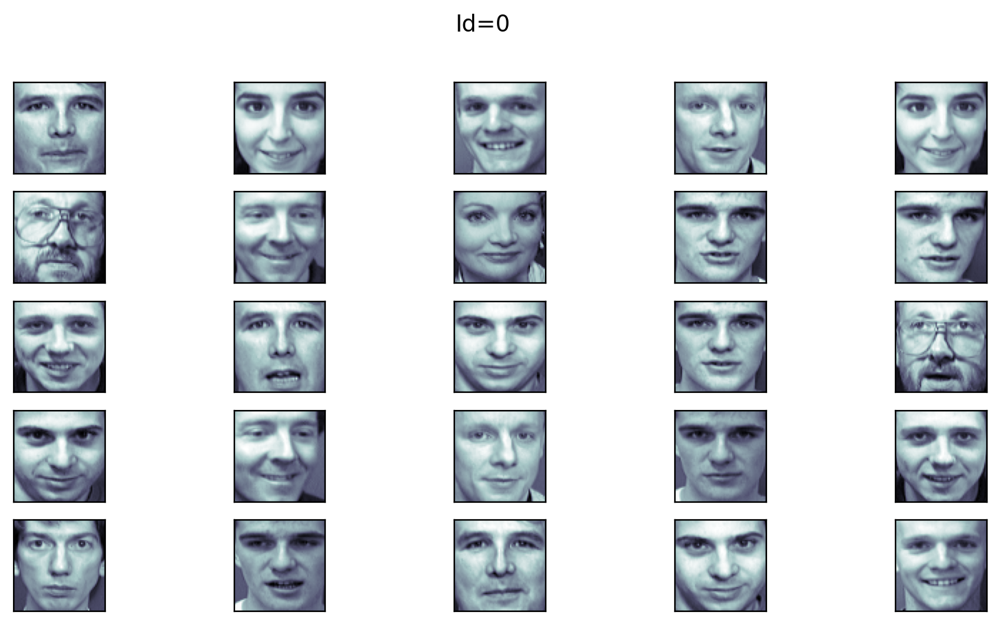

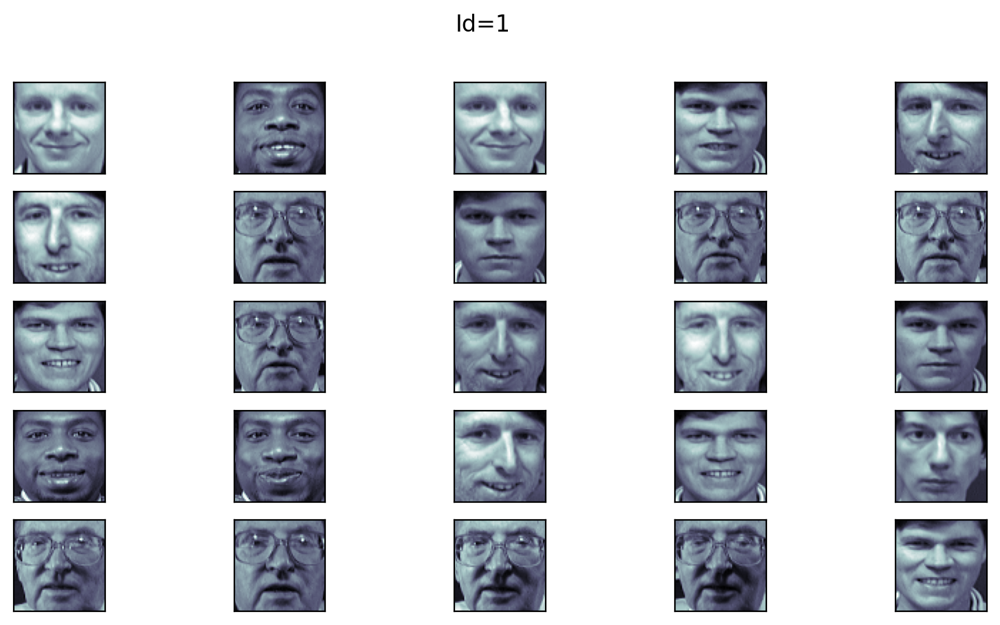

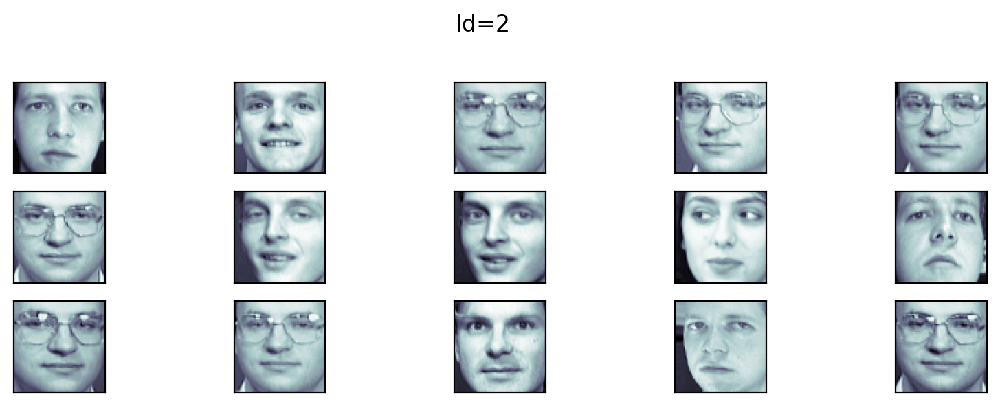

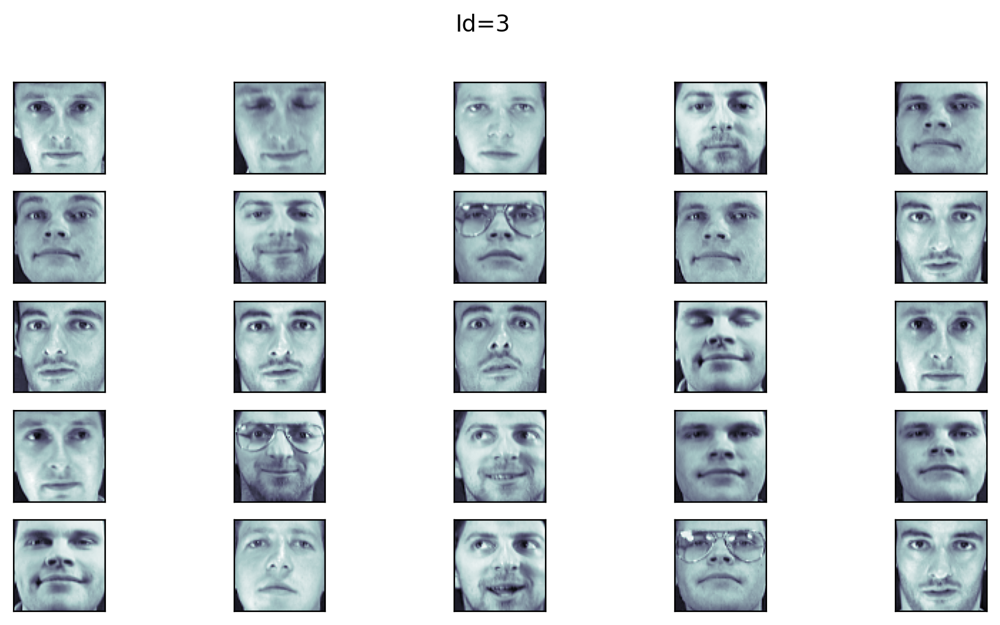

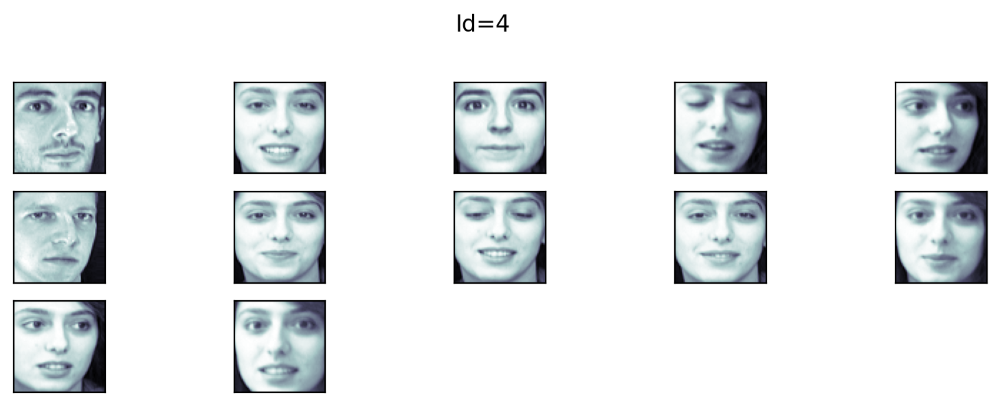

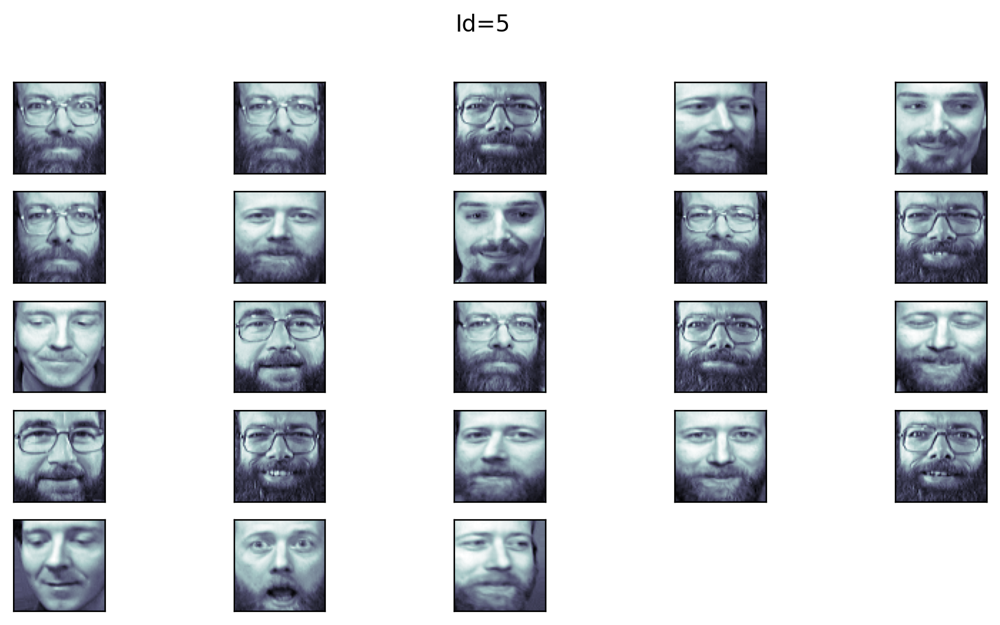

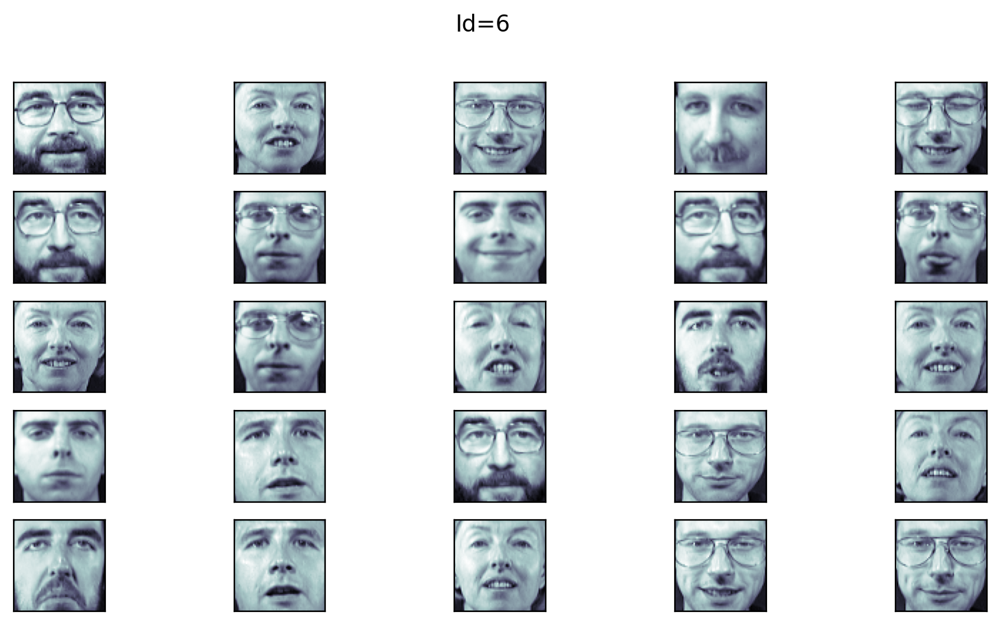

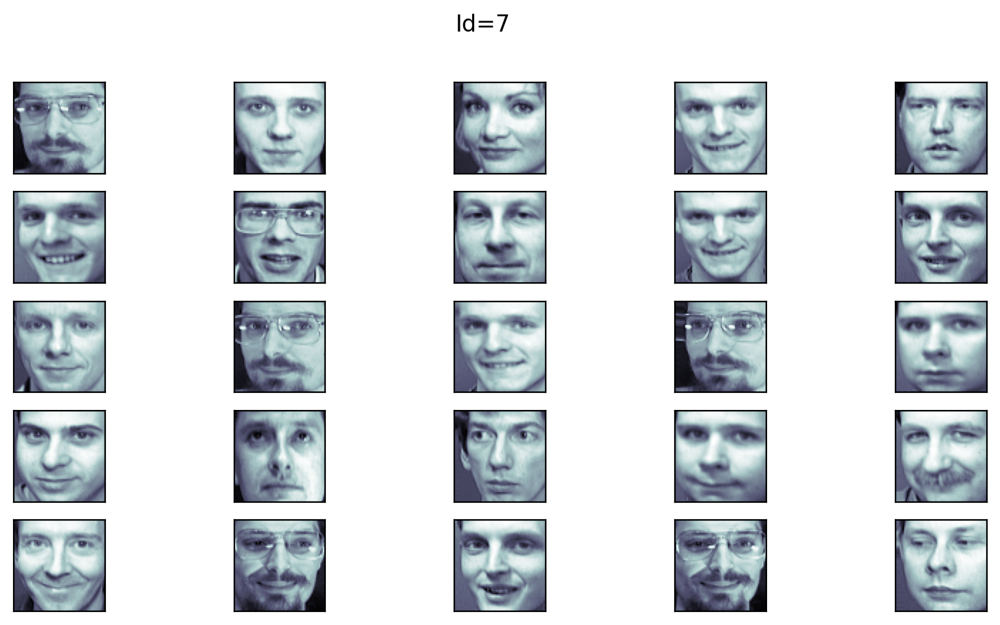

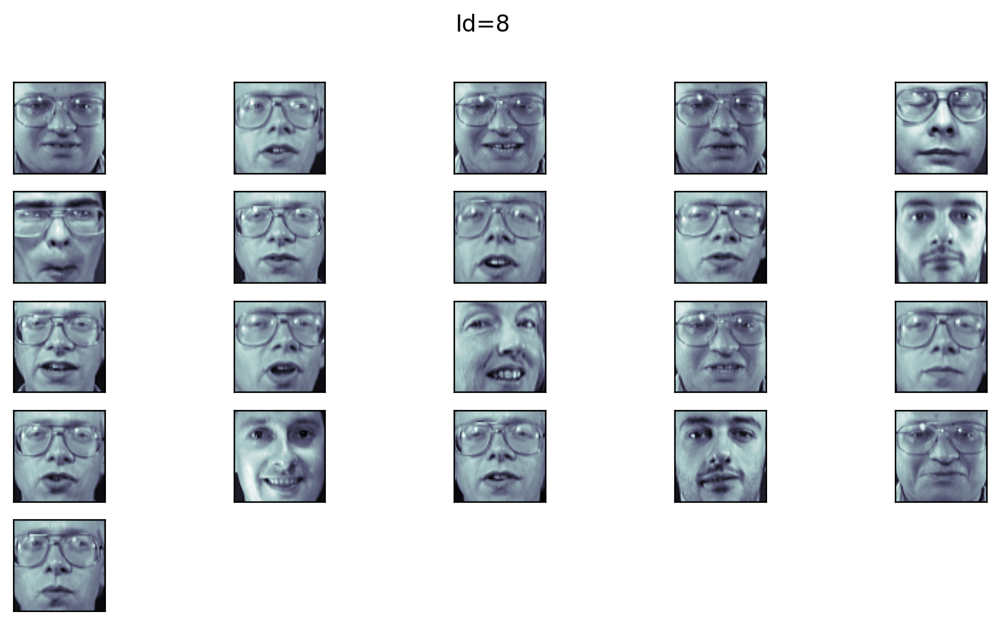

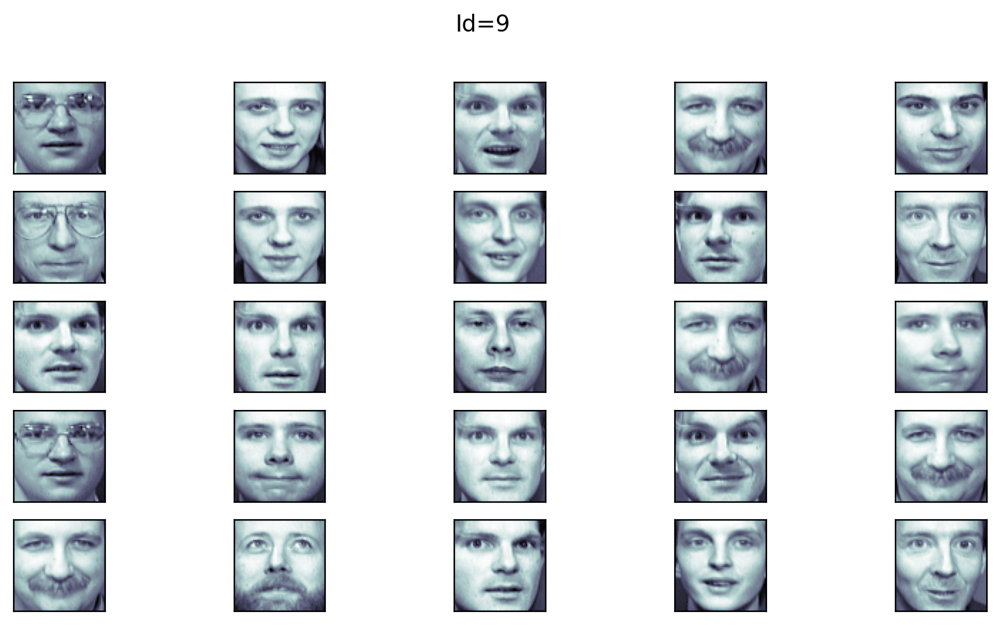

In [33]:
for labelID in range(n_clusters):
    # find all indexes into the `data` array that belong to the
    # current label ID, then randomly sample a maximum of 25 indexes
    # from the set
    idxs = np.where(clusters == labelID)[0]
    idxs = np.random.choice(idxs, size=min(25, len(idxs)), replace=False)

    # Extract the sampled indexes
    id_face = faces.images[idxs]

    # Plots sampled faces
    fig = plt.figure(figsize=(10, 5))
    for i in range(min(25, len(idxs))):
        ax = fig.add_subplot(5, 5, i + 1, xticks=[], yticks=[])
        ax.imshow(id_face[i], cmap=plt.cm.bone)
    fig.suptitle(f"Id={labelID}")


While the algorithm isn't perfect, we can see that K-means with PCA is picking up on some facial similarity or similar expressions. 

In [ ]:
#Test Trial for Sampled Dataset using K-means, SVD, and Random Classifier

In [4]:
df = pd.read_csv('datasets/hotel_booking.csv')

In [5]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,...,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,name,email,phone-number
0,City Hotel,1,157,May,1,3,2,0.0,0,BB,...,0,Non Refund,0,Transient,130.00,0,0,Taylor Juarez,Juarez.Taylor44@zoho.com,634-458-8010
1,Resort Hotel,0,167,September,2,8,2,0.0,0,BB,...,0,No Deposit,0,Contract,62.48,0,2,Yolanda Taylor,Taylor.Yolanda35@xfinity.com,571-733-2380
2,City Hotel,0,124,April,1,1,2,0.0,0,SC,...,0,No Deposit,0,Transient,99.00,0,1,Angie Dixon,Angie_Dixon@hotmail.com,818-661-8987
3,Resort Hotel,0,8,July,2,4,2,1.0,0,BB,...,0,No Deposit,0,Transient,169.00,1,2,Jennifer Higgins,Higgins.Jennifer@yandex.com,669-803-3888
4,City Hotel,0,43,July,0,2,2,0.0,0,HB,...,1,No Deposit,0,Transient-Party,43.00,0,0,Jeremy Wilcox,Jeremy_Wilcox@hotmail.com,100-100-0744


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69591 entries, 0 to 69590
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           69591 non-null  object 
 1   is_canceled                     69591 non-null  int64  
 2   lead_time                       69591 non-null  int64  
 3   arrival_date_month              69591 non-null  object 
 4   stays_in_weekend_nights         69591 non-null  int64  
 5   stays_in_week_nights            69591 non-null  int64  
 6   adults                          69591 non-null  int64  
 7   children                        69588 non-null  float64
 8   babies                          69591 non-null  int64  
 9   meal                            69591 non-null  object 
 10  country                         69591 non-null  object 
 11  previous_cancellations          69591 non-null  int64  
 12  previous_bookings_not_canceled  

In [7]:
df.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_month                0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          3
babies                            0
meal                              0
country                           0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests         0
name                              0
email                             0
phone-number                      0
dtype: int64

In [8]:
df = df.drop(['email'], axis=1)
df = df.drop(['name'], axis=1)
df = df.drop(["phone-number"], axis=1)

In [9]:
children_mean = df['children'].mean()
df['children'] = df['children'].fillna(children_mean)

In [10]:
sampled_df = df.sample(n=10000, random_state=42)

In [11]:
sampled_df["is_canceled"].value_counts()

is_canceled
0    6076
1    3924
Name: count, dtype: int64

In [13]:
sampled_df = sampled_df.drop('total_of_special_requests', axis=1)

In [14]:
sampled_df = sampled_df.drop(['adr'], axis=1)